<center>
    <img src="https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/assets/logos/SN_web_lightmode.png" width="300" alt="cognitiveclass.ai logo">
</center>


# **End-to-End Example: Transfer Learning**


In this lab, we will walk through an end-to-end example of transfer learning and fine-tuning. 

Transfer learning is a deep learning technique that reuses a pretrained model, such as VGG16, to solve a new but related task. Instead of training a large neural network from scratch, we leverage features already learned from large datasets such as ImageNet.

A typical transfer learning workflow contains the following steps:

1. Load a pretrained model and remove its original classification layers by setting `include_top=False`.
2. Freeze the pretrained convolutional base so its weights remain unchanged during initial training. The pretrained model acts as a fixed feature extractor.
3. Add new classification layers that match the new task, such as Dense and Dropout layers.
4. Train only the newly added classifier layers while keeping the pretrained layers frozen.
5. Optionally perform **fine-tuning** by unfreezing some of the deeper pretrained layers and retraining them with a small learning rate. This allows the model to better adapt its learned features to the new dataset while preserving general visual features learned during pretraining.


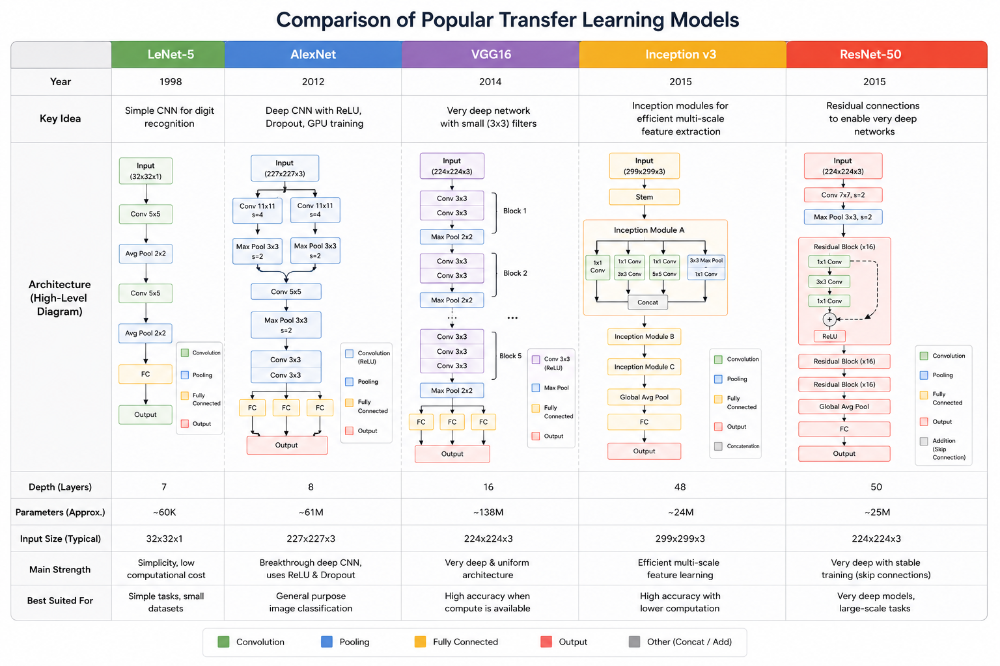

## **Is the waste product organic or a recyclable?** 


You are a data science intern at a waste management service. Your manager has asked you to create a waste classification pipeline that categorizes waste streams based on disposal options: organic or recyclable. 

In this lab we're going to train a transfer learning model to perform this image classification task.


<img src="https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-ML311-Coursera/labs/Module3/L2/img/transfer_learning.gif" width="600" height="600">


## **Table of Contents**

1. [Objectives](#toc-objectives)
2. [Setup](#toc-setup)
    1. [Installing Required Libraries](#toc-installing-required-libraries)
    2. [Importing Required Libraries](#toc-importing-required-libraries)
3. [Background](#toc-background)
    1. [What is transfer learning?](#toc-what-is-transfer-learning)
4. [Example 1: Create a ML model for distinguishing recyclable and organic waste images](#toc-example-1-create-a-ml-model-for-distinguishing-recyclable-and-organic-waste-images)
    1. [Dataset](#toc-dataset)
    2. [Importing Data](#toc-importing-data)
    3. [Define configuration options](#toc-define-configuration-options)
    4. [Loading Images using ImageGeneratorClass](#toc-loading-images-using-imagegeneratorclass)
        1. [Image Augmentation](#toc-image-augmentation)
    5. [Loading Images using tf.data pipeline](#toc-loading-images-using-tf-data-pipeline)
    6. [Pre-trained Models](#toc-pre-trained-models)
        1. [VGG-16](#toc-vgg-16)
        2. [Freezing Layers](#toc-freezing-layers)
    7. [Compile the model](#toc-compile-the-model)
        1. [Callbacks](#toc-callbacks)
    8. [Fit and train the model](#toc-fit-and-train-the-model)
    9. [Fine-Tuning](#toc-fine-tuning)
    10. [Evaluate both models on test data](#toc-evaluate-both-models-on-test-data)
        1. [Custom image: is your waste organic or a recyclable?](#toc-custom-image-is-your-waste-organic-or-a-recyclable)
5. [Modern TensorFlow Transfer Learning Pipeline for Example 1](#toc-modern-tensorflow-transfer-learning-pipeline-for-example-1)
6. [Example 2: Use Transfer Learning for identifying Stop Signs](#toc-example-2-use-transfer-learning-for-identifying-stop-signs)
    1. [Loading images](#toc-loading-images)
        1. [Creating image directories](#toc-creating-image-directories)
        2. [Moving images](#toc-moving-images)
        3. [Displaying raw images](#toc-displaying-raw-images)
        4. [Building image data generators](#toc-building-image-data-generators)
    2. [Defining a helper function for building, compiling, and fitting CNNs](#toc-defining-a-helper-function-for-building-compiling-and-fitting-cnns)
    3. [Pre-trained Model 1: Inception-v3](#toc-pre-trained-model-1-inception-v3)
    4. [Pre-trained Model 2: MobileNet](#toc-pre-trained-model-2-mobilenet)
    5. [Pre-trained Model 3: ResNet-50](#toc-pre-trained-model-3-resnet-50)

## **Objectives** <a id="toc-objectives"></a>

After completing this lab you will be able to:

- __Perform__ pre-processing and image augmentation on ImageGeneratorClass objects in Keras. 
- __Implement__ transfer learning in five general steps: 
    - obtain pre-trained model, 
    - create base model, 
    - freeze layers, 
    - train new layers on dataset, 
    - improve model through fine tuning.
- __Build__ an end-to-end VGG16-based transfer learning model for binary image classification tasks.


## **Setup** <a id="toc-setup"></a>


For this lab, we will be using the following libraries:

*   [`pandas`](https://pandas.pydata.org/?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkCoursesIBMML0187ENSkillsNetwork31430127-2021-01-01) for managing the data.
*   [`numpy`](https://numpy.org/?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkCoursesIBMML0187ENSkillsNetwork31430127-2021-01-01) for mathematical operations.
*   [`sklearn`](https://scikit-learn.org/stable/?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkCoursesIBMML0187ENSkillsNetwork31430127-2021-01-01) for machine learning and machine-learning-pipeline related functions.
*   [`seaborn`](https://seaborn.pydata.org/?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkCoursesIBMML0187ENSkillsNetwork31430127-2021-01-01) for visualizing the data.
*   [`matplotlib`](https://matplotlib.org/?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkCoursesIBMML0187ENSkillsNetwork31430127-2021-01-01) for additional plotting tools.
*   [`keras`](https://keras.io/?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkCoursesIBMML0187ENSkillsNetwork31430127-2021-01-01) for loading datasets.


### **Installing Required Libraries** <a id="toc-installing-required-libraries"></a>

The following required libraries are pre-installed in the Skills Network Labs environment. However, if you run these notebook commands in a different Jupyter environment (like Watson Studio or Ananconda), you will need to install these libraries by removing the `#` sign before `!pip install tensorflow_datasets`, `!pip install --upgrade tensorflow` and `!pip install opendatasets` in the following code cell.


In [1]:
# All Libraries required for this lab are listed below. The libraries pre-installed on Skills Network Labs are commented.
# !mamba install -qy pandas==1.3.4 numpy==1.21.4 seaborn==0.9.0 matplotlib==3.5.0 scikit-learn==0.20.1
# Note: If your environment doesn't support "!mamba install", use "!pip install"

Shell command to upgrade TensorFlow to a newer version in this notebook environment. \
The `!` means “run in shell, not Python”. \

In [2]:
# !pip install --upgrade tensorflow

### **Importing Required Libraries** <a id="toc-importing-required-libraries"></a>


In [3]:
# General utilities
import datetime
import glob
import os
import shutil
import warnings
from os import listdir, makedirs
from random import random, seed

import numpy as np
import skillsnetwork

# Warnings / logging
warnings.simplefilter("ignore")
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "2"

# Plotting / visualization
import seaborn as sns
from matplotlib import pyplot as plt
from matplotlib.image import imread

# Keras / TensorFlow imports
import keras
import tensorflow as tf
from tensorflow.keras import optimizers
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.layers import (
    Conv2D,
    Dense,
    Dropout,
    Flatten,
    GlobalAveragePooling2D,
    Input,
    InputLayer,
    MaxPooling2D,
    RandomFlip,
    RandomRotation,
    RandomZoom,
    Rescaling,
)
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# scikit-learn
from sklearn import metrics

print(tf.__version__)
tf.config.set_visible_devices([], "GPU")

sns.set_context("notebook")
sns.set_style("white")

2.20.0


E0000 00:00:1779914179.775856  999234 cuda_executor.cc:1309] INTERNAL: CUDA Runtime error: Failed call to cudaGetRuntimeVersion: Error loading CUDA libraries. GPU will not be used.: Error loading CUDA libraries. GPU will not be used.
W0000 00:00:1779914179.780746  999234 gpu_device.cc:2342] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...


## **Background** <a id="toc-background"></a>


### **What is transfer learning?** <a id="toc-what-is-transfer-learning"></a>


Many popular deep learning models are hard to train from scratch. They often need very large datasets, such as ImageNet, many training steps, and powerful computers. The early layers of these models usually learn general image features, such as edges, colors, and simple shapes. Later layers learn features that are more specific to the original task.

__Transfer learning__ reuses a model that has already learned useful features. We keep the early layers from the pre-trained model and train new later layers on our own dataset. This lets us build a strong model with less data and less training time.


A typical transfer learning workflow in Keras follows these steps:
    
1. Load a base model with pre-trained weights, such as ImageNet weights.
2. Freeze the base model so its learned weights do not change during training.
3. Add new layers on top of the base model for your specific task.
4. Train the new model on your dataset.


## **Example 1: Create a ML model for distinguishing recyclable and organic waste images** <a id="toc-example-1-create-a-ml-model-for-distinguishing-recyclable-and-organic-waste-images"></a>


### **Dataset** <a id="toc-dataset"></a>


The dataset used in this Lab was found on Kaggle, which is an awesome community for people who enjoy anything related to data science and machine learning. We will be using the Waste Classification Dataset [dataset](https://www.kaggle.com/datasets/techsash/waste-classification-data):


> PROBLEM: 
> - Waste management is a big problem in our country. Most of the wastes end up in landfills.

> APPROACH: 
> - Segregated into two classes (Organic and recyclable)
> - Automated the process by using IOT and machine learning

> IMPLEMENTATION:
> - Dataset is divided into train data (85%) and test data (15%)
> - Training data - 22,564 images Test data - 2,513 images


* The dataset contains ~25,000 images of recyclable and organic products split into a train and test set.
* Our goal is to train an algorithm on these files and to predict the labels for images in our test set (1 = recyclable, 0 = organic).


Now that we have obtained the necessary context and some insight in today's dataset, we're moving on to the practical part: using transfer learning to classify images. In this task, we will be using Tensorflow, which is a highly used ML library for training neural networks, and Keras, which is an API that makes this process simpler.


We will go through the following steps to create our classification model:


1. Import data directly from Kaggle.
2. Visualize a few random images from the train set.
3. Load images in using the ImageGeneratorClass from Keras.
4. Define model configuration options.
5. Perform some image augmentation for improved model generalizability.
6. Load, compile and train a pre-trained model like VGG-16.
7. Perform inference on the test set. 


### **Importing Data** <a id="toc-importing-data"></a>


This will create a `o-vs-r-split` directory in your environment.


In [4]:
import skillsnetwork

await skillsnetwork.prepare(
    "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-ML311-Coursera/datasets/o-vs-r-split.tar.gz",
    overwrite=True,
)

  0%|          | 0/8097 [00:00<?, ?it/s]

Saved to '.'


### **Define configuration options** <a id="toc-define-configuration-options"></a>


It's time to define some model configuration options.


* __img_rows__ and __img_cols__ are used to specify width and height of the images expected by MobileNet.
* __batch size__ is set to 32.
* The __number of epochs__ (that is, iterations) is set to 5, but as we are using Early Stopping, the number of iterations might be lower if early stopping conditions are met before 5 iterations.
* The __number of classes__ is 2.
* We will use 20% of the data for __validation__ purposes.
* We want to be able to see the model output, so we set __verbosity__ to 1, or True.
* The __path__ is a path to the directory with the training data and __path_test__ should contain the test data.
* The __input_shape__ is common for an image: (w, h, d).
* We have two __labels__ in our dataset: organic (O), recyclable (R).
* The __checkpoint_path__ is where ModelCheckpoint will save our model.


In [5]:
img_rows, img_cols = 150, 150
batch_size = 32
n_epochs = 10
n_classes = 2
val_split = 0.2
verbosity = 1
path = "o-vs-r-split/train/"
path_test = "o-vs-r-split/test/"
input_shape = (img_rows, img_cols, 3)  # RGB
labels = ["O", "R"]
seed = 10
checkpoint_path = "ORnet.h5"

### **Loading Images using ImageGeneratorClass** <a id="toc-loading-images-using-imagegeneratorclass"></a>


Transfer learning works best when models are trained on smaller datasets. We are using 10,000 images from the original dataset of 25,000 images. We are setting aside 10% of the set for testing purposes.

The folder structure looks as follows:


```python
o-vs-r-split/
└── train
    ├── O
    └── R
└── test
    ├── O
    └── R
```

#### **Image Augmentation** <a id="toc-image-augmentation"></a>


Now we will create ImageDataGenerators used for training, validation, and testing.

Image data generators create batches of tensor image data with real-time data augmentation. They loop over the data in batches and are useful in feeding data to the training process. We specify a 20% validation split.

We will perform a few image augmentation steps. We set __rescale__ to 1./255. This means that each image pixel will be divided by 255 in order to normalize the image. We set the __width_shift_range__ and __height_shift_range__ to 0.1 each, and the __horizontal_flip__ to True. 
* The __width_shift_range__ shifts the image horizontally (left or right). 
* The __height_shift_range__ shifts the image vertically (up or down). 
* The __horizontal_flip__ randomly flip inputs horizontally.


In [6]:
# Create ImageDataGenerators for training and validation and testing
train_datagen = ImageDataGenerator(
    validation_split=val_split,
    rescale=1.0 / 255.0,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
)

val_datagen = ImageDataGenerator(
    validation_split=val_split,
    rescale=1.0 / 255.0,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
)

test_datagen = ImageDataGenerator(rescale=1.0 / 255.0)

Since it is undesirable to load all of our image data into memory all at once, we make use of the __flow_from_directory__ method. It takes the ImageDataGenerator training/validation sets and flows image batches from a specified folder. 

* We set __directory__ to the __path__, specifying the path to our training dataset. 
* We specify classes using __labels__ we had defined in the configuration step.
* We apply a __seed__ so our random initializer is generated in the same way each time we perform this step. This allows for direct comparison between experiments.


In [7]:
# use the labels defined before to
# find number of images belonging to each category
train_generator = train_datagen.flow_from_directory(
    directory=path,
    classes=labels,
    seed=seed,
    batch_size=batch_size,
    class_mode="binary",
    shuffle=True,
    target_size=(img_rows, img_rows),
    subset="training",
)

Found 5810 images belonging to 2 classes.


In [8]:
val_generator = val_datagen.flow_from_directory(
    directory=path,
    classes=labels,
    seed=seed,
    batch_size=batch_size,
    class_mode="binary",
    shuffle=True,
    target_size=(img_rows, img_rows),
    subset="validation",
)

Found 1452 images belonging to 2 classes.


In [9]:
test_generator = test_datagen.flow_from_directory(
    directory=path_test,
    classes=labels,
    class_mode="binary",
    seed=seed,
    batch_size=batch_size,
    shuffle=True,
    target_size=(img_rows, img_rows),
)

Found 828 images belonging to 2 classes.


### **Loading Images using tf.data pipeline** <a id="toc-loading-images-using-tf-data-pipeline"></a>

`ImageDataGenerator` is less popular today because modern TensorFlow workflows prefer the more efficient `tf.data pipeline` and preprocessing layers integrated directly into the model. These newer approaches provide better performance, improved GPU utilization, easier deployment, and cleaner end-to-end deep learning pipelines.

The modern TensorFlow `tf.data pipeline` uses functions such as `image_dataset_from_directory()`, `.map()`, `.batch()`, and `.prefetch()` to efficiently load, preprocess, and feed data into deep learning models. It provides faster performance, better GPU utilization, and cleaner end-to-end integration with TensorFlow and Keras workflows.

In [10]:
# Create training dataset
train_dataset = tf.keras.utils.image_dataset_from_directory(
    path,
    labels="inferred",
    label_mode="binary",
    class_names=labels,
    validation_split=val_split,
    subset="training",
    seed=seed,
    image_size=(img_rows, img_rows),
    batch_size=batch_size,
    shuffle=True,
)

# Create validation dataset
val_dataset = tf.keras.utils.image_dataset_from_directory(
    path,
    labels="inferred",
    label_mode="binary",
    class_names=labels,
    validation_split=val_split,
    subset="validation",
    seed=seed,
    image_size=(img_rows, img_rows),
    batch_size=batch_size,
    shuffle=True,
)

# Create test dataset
test_dataset = tf.keras.utils.image_dataset_from_directory(
    path_test,
    labels="inferred",  # Automatically infer labels from folder names
    label_mode="binary",
    class_names=labels,  # forces the class ordering
    image_size=(img_rows, img_rows),
    batch_size=batch_size,
    shuffle=False,
)

# Define preprocessing and augmentation pipeline
data_augmentation = tf.keras.Sequential(
    [
        tf.keras.layers.Rescaling(1.0 / 255),
        tf.keras.layers.RandomTranslation(0.1, 0.1),
        tf.keras.layers.RandomFlip("horizontal"),
    ]
)

# place augmentation layers directly inside the model.
model = tf.keras.Sequential(
    [
        data_augmentation,
        tf.keras.layers.Rescaling(1.0 / 255),
        tf.keras.layers.Conv2D(32, 3, activation="relu"),
        tf.keras.layers.MaxPooling2D(),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(1, activation="sigmoid"),
    ]
)

Found 7262 files belonging to 2 classes.
Using 5810 files for training.
Found 7262 files belonging to 2 classes.
Using 1452 files for validation.
Found 828 files belonging to 2 classes.


There were 5810 images belonging to 2 classes found in the train directory, and 1452 images belonging to the same two classes were found in the validation directory, and 828 images were found in the test set.


Let's look at a few augmented images:


Labels: ['O', 'O', 'O', 'O', 'O']


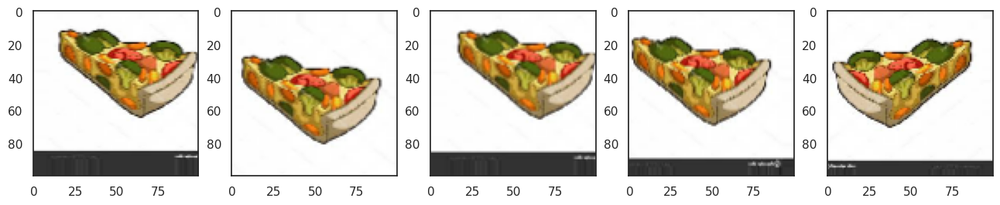

In [11]:
IMG_DIM = (100, 100)

train_files = glob.glob("./o-vs-r-split/train/O/*")
train_imgs = [
    tf.keras.preprocessing.image.img_to_array(
        tf.keras.preprocessing.image.load_img(img, target_size=IMG_DIM)
    )
    for img in train_files
]
train_imgs = np.array(train_imgs)
train_labels = [fn.split("/")[3].split(".")[0].strip() for fn in train_files]

img_id = 0
O_generator = train_datagen.flow(
    train_imgs[img_id : img_id + 1],
    train_labels[img_id : img_id + 1],
    batch_size=1,
)
O = [next(O_generator) for i in range(0, 5)]
fig, ax = plt.subplots(1, 5, figsize=(16, 6))
print("Labels:", [item[1][0] for item in O])
l = [ax[i].imshow(O[i][0][0]) for i in range(0, 5)]

A modern TensorFlow approach to visuisualize the data and its augmentations"""

Found 7262 files belonging to 2 classes.


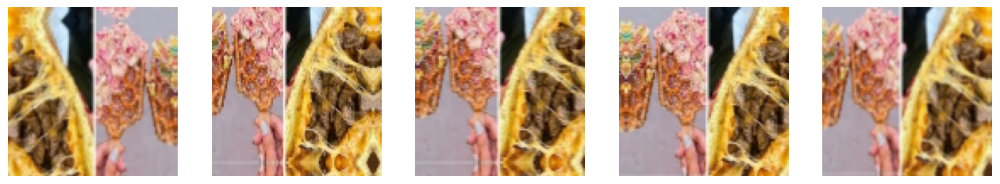

In [12]:
IMG_SIZE = (100, 100)

# Load dataset
train_dataset = tf.keras.utils.image_dataset_from_directory(
    "./o-vs-r-split/train", image_size=IMG_SIZE, batch_size=1, shuffle=True
)

# Define augmentation
data_augmentation = tf.keras.Sequential(
    [
        tf.keras.layers.RandomFlip("horizontal"),
        tf.keras.layers.RandomTranslation(0.1, 0.1),
    ]
)

# Take one image batch 32 photos
for images, labels in train_dataset.take(1):

    plt.figure(figsize=(16, 6))

    for i in range(5):

        augmented_image = data_augmentation(images, training=True)

        ax = plt.subplot(1, 5, i + 1)

        plt.imshow(augmented_image[0].numpy().astype("uint8"))

        plt.axis("off")

    plt.show()

### **Pre-trained Models** <a id="toc-pre-trained-models"></a>


Pre-trained models are neural networks that have already been trained on large datasets, usually for large-scale image classification tasks. Instead of training a model completely from scratch, we can reuse these models and adapt them to new tasks using a technique called transfer learning.

These models have already learned useful low-level and high-level features such as edges, textures, shapes, and object patterns. In transfer learning, we typically use the pre-trained model as a feature extractor by keeping the original weights fixed and only training a new final classification layer for the target task. This allows us to leverage knowledge learned from the original source dataset while reducing training time and the amount of required data.

A more advanced approach is called fine-tuning. In fine-tuning, we not only replace and train the final layer, but also unfreeze and retrain some of the earlier layers of the pre-trained model. This allows the model to better adapt its learned features to the new dataset and task.

In computer vision, some popular pre-trained models include: VGG-16, VGG-19, InceptionV3, XCeption, and ResNet-50.


#### **VGG-16** <a id="toc-vgg-16"></a>


Let us load the VGG16 model using TensorFlow Keras:

```python
tf.keras.applications.VGG16(
    include_top=True,
    weights="imagenet",
    input_shape=None,
)
```
The default input image size for VGG16 is $224 \times 224$  with 3 color channels (RGB), giving an input shape of (224, 224, 3).


Further information on arguments can be found in the Keras [documentation](https://keras.io/api/applications/vgg/).

>**Important:** Each Keras application model requires a specific preprocessing step before inference or training. For VGG16, inputs should be preprocessed using:
```python
tf.keras.applications.vgg16.preprocess_input
```
>This function converts images from RGB to BGR format and subtracts the ImageNet dataset mean from each color channel. No pixel scaling is applied.

The main arguments are:

- `include_top`: Determines whether to include the original fully connected classification layers at the top of the network. Set this to `False` when using VGG16 for transfer learning or feature extraction.
- `weights`: Specifies which weights to load. Common options are:
    - `"imagenet"`: loads weights pre-trained on the ImageNet dataset
    - `None`: initializes the model with random weights
    - a file path: loads custom saved weights
- `input_shape`: Defines the input image shape. This argument is usually specified only when `include_top=False`. If `include_top=True`, the expected input shape must remain (224, 224, 3)


First we load the model 


In [13]:
from keras.applications import vgg16

input_shape = (150, 150, 3)

vgg = vgg16.VGG16(
    include_top=False, weights="imagenet", input_shape=input_shape
)

We flatten the output of a vgg model and assign it to the model ```output```, we then use a Model object ```basemodel``` to group the layers into an object for training and inference .
With the following inputs and outputs  

inputs: ```vgg.input```

outputs: ```tf.keras.layers.Flatten()(output)```


In [14]:
output = vgg.layers[-1].output
output = tf.keras.layers.Flatten()(output)
basemodel = Model(vgg.input, output)

#### **Freezing Layers** <a id="toc-freezing-layers"></a>
Next, we freeze the basemodel, like the lower layers.


In [15]:
basemodel.trainable = False
for layer in basemodel.layers:
    layer.trainable = False

Create a new model on top. We add a Dropout layer for regularization, only these layers will change as for the lower layers we set `training=False` when calling the base model.


In [16]:
input_shape = basemodel.output_shape[1]

model = Sequential()
model.add(basemodel)
model.add(Dense(512, activation="relu", input_dim=input_shape))
model.add(Dropout(0.3))
model.add(Dense(512, activation="relu"))
model.add(Dropout(0.3))
model.add(Dense(1, activation="sigmoid"))

Let us print the model summary.


In [17]:
print(model.summary())

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ functional_1 (Functional)       │ (None, 8192)           │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 512)            │     4,194,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 512)            │       262,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │           513 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 19,172,673 (73.14 MB)

 Trainable params: 4,457,985 (17.01 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

None


**Improved Modern Version**

In [18]:
from tensorflow.keras.applications import VGG16

# Define input shape
input_shape = (150, 150, 3)

# Load pretrained VGG16 convolutional base
base_model = VGG16(
    include_top=False, weights="imagenet", input_shape=input_shape
)

# Freeze pretrained layers
base_model.trainable = False

# Build transfer learning model
model = Sequential(
    [
        base_model,
        Flatten(),
        Dense(512, activation="relu"),
        Dropout(0.3),
        Dense(512, activation="relu"),
        Dropout(0.3),
        Dense(1, activation="sigmoid"),
    ]
)

# Display model summary
model.summary()

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)              │ (None, 4, 4, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 512)            │     4,194,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 512)            │       262,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 1)              │           513 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 19,172,673 (73.14 MB)

 Trainable params: 4,457,985 (17.01 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

### **Compile the model** <a id="toc-compile-the-model"></a>


Calling `compile()` freezes the behavior of that model, implying that the trainable attribute values at the time of compilation are preserved.


We use RMSProp as our optimizer with a learning rate of 2e-5, Binary Cross Entropy Loss as our loss function and Accuracy as our primary metric for model evaluation as we have 2 labels in our dataset.


In [19]:
model.compile(
    loss="binary_crossentropy",
    optimizer=optimizers.RMSprop(learning_rate=2e-5),
    metrics=["accuracy"],
)

We use early stopping to avoid over-training the model. An over-trained model overfits the training dataset and has poor performance on unseen test sets. We will also use a exponential step-decay based learning rate scheduler.


In [20]:
from keras.callbacks import LearningRateScheduler

#
checkpoint_path = "O_R_tlearn_image_augm_cnn_vgg16.h5"


# define step decay function
class LossHistory_(keras.callbacks.Callback):
    def on_train_begin(self, logs={}):
        self.losses = []
        self.lr = []

    def on_epoch_end(self, batch, logs={}):
        self.losses.append(logs.get("loss"))
        self.lr.append(exp_decay(len(self.losses)))
        print("lr:", exp_decay(len(self.losses)))


def exp_decay(epoch):
    initial_lrate = 1e-5
    k = 0.1
    lrate = initial_lrate * np.exp(-k * epoch)
    return lrate


# learning schedule callback
loss_history_ = LossHistory_()
lrate_ = LearningRateScheduler(exp_decay)

keras_callbacks = [
    EarlyStopping(monitor="loss", patience=5, mode="min", min_delta=0.01),
    ModelCheckpoint(
        checkpoint_path, monitor="loss", save_best_only=True, mode="min"
    ),
]

callbacks_list_ = [loss_history_, lrate_, keras_callbacks]

#### **Callbacks** <a id="toc-callbacks"></a>
This following code creates several Keras callbacks used during neural network training. It is a modern version of the code used in the previous section.

TensorFlow provides many callbacks. Callbacks are functions that automatically run during training, such as:

- `LearningRateScheduler()`:changing learning rate
- `ModelCheckpoint()`: Saves the best model during training.
- `EarlyStopping()`: Stops training automatically if performance stops improving.

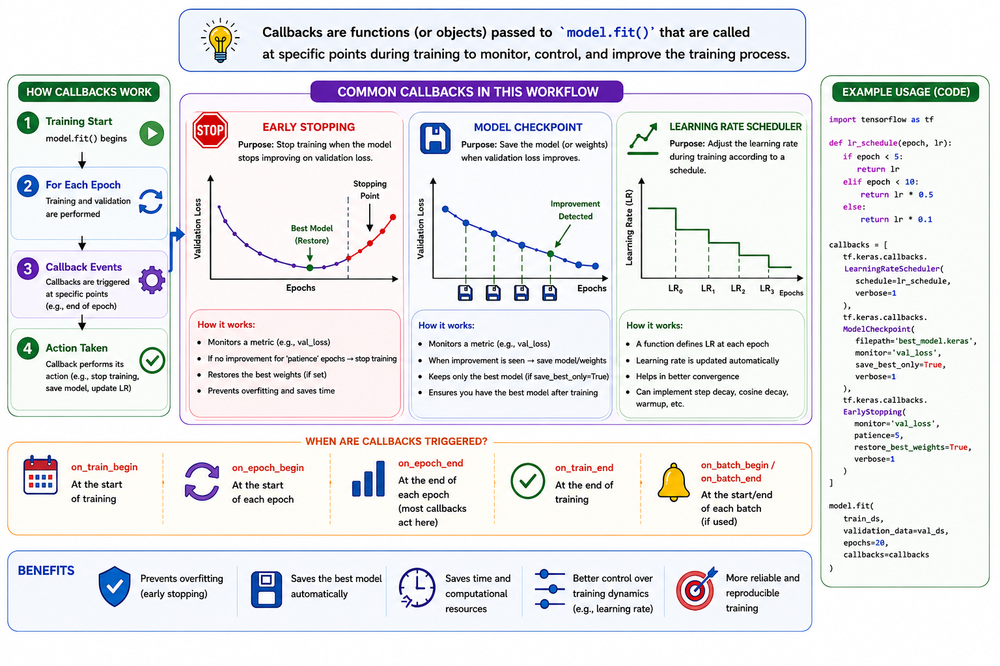

In [25]:
from tensorflow.keras.callbacks import (
    EarlyStopping,
    ModelCheckpoint,
    LearningRateScheduler,
)

# Path to save best model
checkpoint_path = "O_R_tlearn_image_augm_cnn_vgg16.keras"


# Exponential learning rate decay
def exp_decay(epoch, lr=None):

    initial_lr = 1e-5
    decay_rate = 0.1

    return initial_lr * np.exp(-decay_rate * epoch)  # Exponential decay formula


# Learning rate scheduler
lr_scheduler = LearningRateScheduler(exp_decay)

# Callback list
callbacks = [
    lr_scheduler,
    EarlyStopping(
        monitor="val_loss",
        patience=5,  # Number of epochs with no improvement after which training will be stopped
        restore_best_weights=True,
    ),
    ModelCheckpoint(
        filepath=checkpoint_path, monitor="val_loss", save_best_only=True
    ),
]

### **Fit and train the model** <a id="toc-fit-and-train-the-model"></a>


In [26]:
extract_feat_model = model.fit(
    train_generator,
    steps_per_epoch=10,
    epochs=5,
    validation_data=val_generator,
    validation_steps=10,
    verbose=1,
    callbacks=callbacks_list_,
)

Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - accuracy: 0.6287 - loss: 0.6609

lr: 9.048374180359596e-06
10/10 ━━━━━━━━━━━━━━━━━━━━ 3s 327ms/step - accuracy: 0.6156 - loss: 0.6653 - val_accuracy: 0.6656 - val_loss: 0.6070 - learning_rate: 1.0000e-05
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step - accuracy: 0.6856 - loss: 0.6150

lr: 8.18730753077982e-06
10/10 ━━━━━━━━━━━━━━━━━━━━ 3s 304ms/step - accuracy: 0.6667 - loss: 0.6228 - val_accuracy: 0.6906 - val_loss: 0.5923 - learning_rate: 9.0484e-06
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - accuracy: 0.7077 - loss: 0.6060

lr: 7.408182206817179e-06
10/10 ━━━━━━━━━━━━━━━━━━━━ 3s 308ms/step - accuracy: 0.7031 - loss: 0.6028 - val_accuracy: 0.7031 - val_loss: 0.5772 - learning_rate: 8.1873e-06
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - accuracy: 0.6782 - loss: 0.6205lr: 6.7032004603563925e-06
10/10 ━━━━━━━━━━━━━━━━━━━━ 3s 301ms/step - accuracy: 0.6875 - loss: 0.6110 - val_accuracy: 0.7719 - val_loss: 0.5603 - learning_rate: 7.4082e-06
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step - accuracy: 0.7866 - loss: 0.5374

lr: 6.065306597126334e-06
10/10 ━━━━━━━━━━━━━━━━━━━━ 3s 307ms/step - accuracy: 0.7531 - loss: 0.5503 - val_accuracy: 0.7750 - val_loss: 0.5441 - learning_rate: 6.7032e-06


### **Fine-Tuning** <a id="toc-fine-tuning"></a>


Fine-tuning is an optional but commonly used step in transfer learning that can further improve model performance. Unlike feature extraction, where the pre-trained model weights remain fixed, fine-tuning retrains some of the pre-trained layers so the model can better adapt to the new dataset and task.

Fine-tuning can easily cause overfitting because a large number of pre-trained model parameters are retrained on a relatively small new dataset, allowing the model to memorize training data instead of learning general patterns. To reduce this risk, we typically use regularization techniques such as dropout layers, a smaller learning rate, a limited number of epochs, and early stopping to prevent the model from continuing to train after validation performance stops improving.

To fine-tune our model, we will use the pretrained VGG16 model stored in the `basemodel` variable. VGG16 is organized into five convolutional blocks, where the earlier blocks learn very general visual features such as edges, textures, and simple shapes, while the deeper blocks learn more task-specific and higher-level features.

During fine-tuning, we will keep the first three convolutional blocks frozen and unfreeze blocks 4 and 5. This approach preserves the general visual features already learned from the ImageNet dataset while allowing the deeper layers to adapt to the new dataset and classification task. As a result, the convolution and pooling layers in blocks 4 and 5 become trainable, meaning their weights are updated through backpropagation during each training epoch.


We can find the name of each layer


In [27]:
[layer.name for layer in basemodel.layers]

['input_layer_1',
 'block1_conv1',
 'block1_conv2',
 'block1_pool',
 'block2_conv1',
 'block2_conv2',
 'block2_pool',
 'block3_conv1',
 'block3_conv2',
 'block3_conv3',
 'block3_pool',
 'block4_conv1',
 'block4_conv2',
 'block4_conv3',
 'block4_pool',
 'block5_conv1',
 'block5_conv2',
 'block5_conv3',
 'block5_pool',
 'flatten_1']

we then set ```'block5_conv1'```and ```'block4_conv1' ``` to trainable


In [28]:
basemodel.trainable = True

set_trainable = False

for layer in basemodel.layers:
    if layer.name in ["block5_conv1", "block4_conv1"]:
        set_trainable = True
    if set_trainable:
        layer.trainable = True
    else:
        layer.trainable = False

An improved version of above script. 
```python
# Unfreeze convolution blocks 4 and 5 for fine-tuning
for layer in basemodel.layers:

    if layer.name.startswith(("block4", "block5")):
        layer.trainable = True

    else:
        layer.trainable = False
```        

Similar to what we did before, we create a new model on top, add a Dropout layer for regularization, and set `training=False` when calling the base model.


In [29]:
model = Sequential()
model.add(basemodel)
model.add(Dense(512, activation="relu", input_dim=input_shape))
model.add(Dropout(0.3))
model.add(Dense(512, activation="relu"))
model.add(Dropout(0.3))
model.add(Dense(1, activation="sigmoid"))

checkpoint_path = "O_R_tlearn_image_augm_fine_tune_vgg16.h5"


# learning schedule callback
loss_history_ = LossHistory_()
lrate_ = LearningRateScheduler(exp_decay)

keras_callbacks = [
    EarlyStopping(monitor="loss", patience=5, mode="min", min_delta=0.01),
    ModelCheckpoint(
        checkpoint_path, monitor="loss", save_best_only=True, mode="min"
    ),
]

callbacks_list_ = [loss_history_, lrate_, keras_callbacks]

model.compile(
    loss="binary_crossentropy",
    optimizer=optimizers.RMSprop(learning_rate=1e-5),
    metrics=["accuracy"],
)

fine_tune_model = model.fit(
    train_generator,
    steps_per_epoch=10,
    epochs=5,
    callbacks=callbacks_list_,
    validation_data=val_generator,
    validation_steps=10,
    verbose=1,
)

Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step - accuracy: 0.5878 - loss: 0.7204

lr: 9.048374180359596e-06
10/10 ━━━━━━━━━━━━━━━━━━━━ 5s 428ms/step - accuracy: 0.5625 - loss: 0.7030 - val_accuracy: 0.6031 - val_loss: 0.6523 - learning_rate: 1.0000e-05
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step - accuracy: 0.6794 - loss: 0.6123

lr: 8.18730753077982e-06
10/10 ━━━━━━━━━━━━━━━━━━━━ 4s 401ms/step - accuracy: 0.6594 - loss: 0.6086 - val_accuracy: 0.7281 - val_loss: 0.5616 - learning_rate: 9.0484e-06
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step - accuracy: 0.7158 - loss: 0.5778

lr: 7.408182206817179e-06
10/10 ━━━━━━━━━━━━━━━━━━━━ 4s 402ms/step - accuracy: 0.7188 - loss: 0.5716 - val_accuracy: 0.8125 - val_loss: 0.5048 - learning_rate: 8.1873e-06
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step - accuracy: 0.7534 - loss: 0.5500

lr: 6.7032004603563925e-06
10/10 ━━━━━━━━━━━━━━━━━━━━ 4s 401ms/step - accuracy: 0.7500 - loss: 0.5372 - val_accuracy: 0.8750 - val_loss: 0.4101 - learning_rate: 7.4082e-06
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step - accuracy: 0.7329 - loss: 0.4950

lr: 6.065306597126334e-06
10/10 ━━━━━━━━━━━━━━━━━━━━ 4s 406ms/step - accuracy: 0.7812 - loss: 0.4557 - val_accuracy: 0.8406 - val_loss: 0.4014 - learning_rate: 6.7032e-06


The fine tuned model has a validation accuracy higher than the previous transfer learning model.


### **Evaluate both models on test data** <a id="toc-evaluate-both-models-on-test-data"></a>


Load saved models:


In [30]:
extract_feat_model = tf.keras.models.load_model(
    "O_R_tlearn_image_augm_cnn_vgg16.h5"
)
fine_tune_model = tf.keras.models.load_model(
    "O_R_tlearn_image_augm_fine_tune_vgg16.h5"
)

Load test images:


In [31]:
from sklearn.utils import shuffle

IMG_DIM = (150, 150)

# Read in all O and R test images file paths. Shuffle and select 50 random test images.
test_files_O = glob.glob("./o-vs-r-split/test/O/*")
test_files_R = glob.glob("./o-vs-r-split/test/R/*")
test_files = test_files_O + test_files_R
test_files = shuffle(test_files)[0:50]

# Extract label from file path
test_imgs = [
    tf.keras.preprocessing.image.img_to_array(
        tf.keras.preprocessing.image.load_img(img, target_size=IMG_DIM)
    )
    for img in test_files
]
test_imgs = np.array(test_imgs)
test_labels = [fn.split("/")[3].split(".")[0].strip() for fn in test_files]

# Standardize
test_imgs_scaled = test_imgs.astype("float32")
test_imgs_scaled /= 255

In [32]:
class2num_lt = lambda l: [0 if x == "O" else 1 for x in l]
num2class_lt = lambda l: ["O" if x < 0.5 else "R" for x in l]

test_labels_enc = class2num_lt(test_labels)

In [33]:
predictions_extract_feat_model = extract_feat_model.predict(
    test_imgs_scaled, verbose=0
)
predictions_fine_tune_model = fine_tune_model.predict(
    test_imgs_scaled, verbose=0
)

In [34]:
predictions_extract_feat_model = num2class_lt(predictions_extract_feat_model)
predictions_fine_tune_model = num2class_lt(predictions_fine_tune_model)

In [35]:
print("Extract Features Model")
print(
    metrics.classification_report(test_labels, predictions_extract_feat_model)
)

Extract Features Model
              precision    recall  f1-score   support

           O       0.66      0.83      0.73        23
           R       0.81      0.63      0.71        27

    accuracy                           0.72        50
   macro avg       0.73      0.73      0.72        50
weighted avg       0.74      0.72      0.72        50



In [36]:
print("Fine-Tuned Model")
print(metrics.classification_report(test_labels, predictions_fine_tune_model))

Fine-Tuned Model
              precision    recall  f1-score   support

           O       0.77      0.87      0.82        23
           R       0.88      0.78      0.82        27

    accuracy                           0.82        50
   macro avg       0.82      0.82      0.82        50
weighted avg       0.83      0.82      0.82        50



#### **Custom image: is your waste organic or a recyclable?** <a id="toc-custom-image-is-your-waste-organic-or-a-recyclable"></a>


['O']

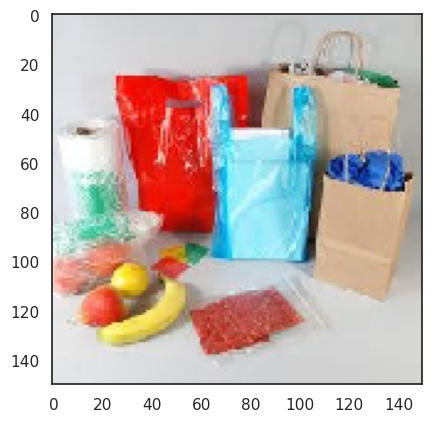

In [37]:
custom_im = test_imgs_scaled[2]
plt.imshow(custom_im)

num2class_lt(
    extract_feat_model.predict(
        custom_im.reshape(
            (
                1,
                test_imgs_scaled.shape[1],
                test_imgs_scaled.shape[2],
                test_imgs_scaled.shape[3],
            )
        ),
        verbose=0,
    )
)

['R']

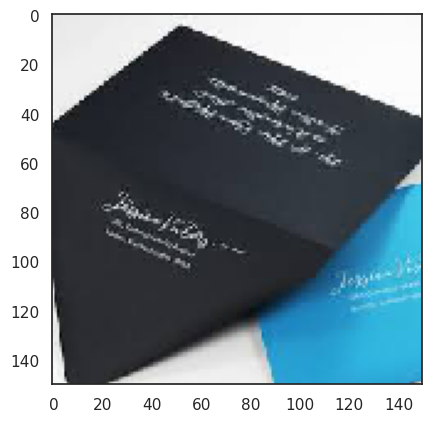

In [38]:
custom_im = test_imgs_scaled[3]
plt.imshow(custom_im)

num2class_lt(
    extract_feat_model.predict(
        custom_im.reshape(
            (
                1,
                test_imgs_scaled.shape[1],
                test_imgs_scaled.shape[2],
                test_imgs_scaled.shape[3],
            )
        ),
        verbose=0,
    )
)

Now we are all set to see if our waste product is an organic or a recyclable.


## **Modern TensorFlow Transfer Learning Pipeline for Example 1** <a id="toc-modern-tensorflow-transfer-learning-pipeline-for-example-1"></a>


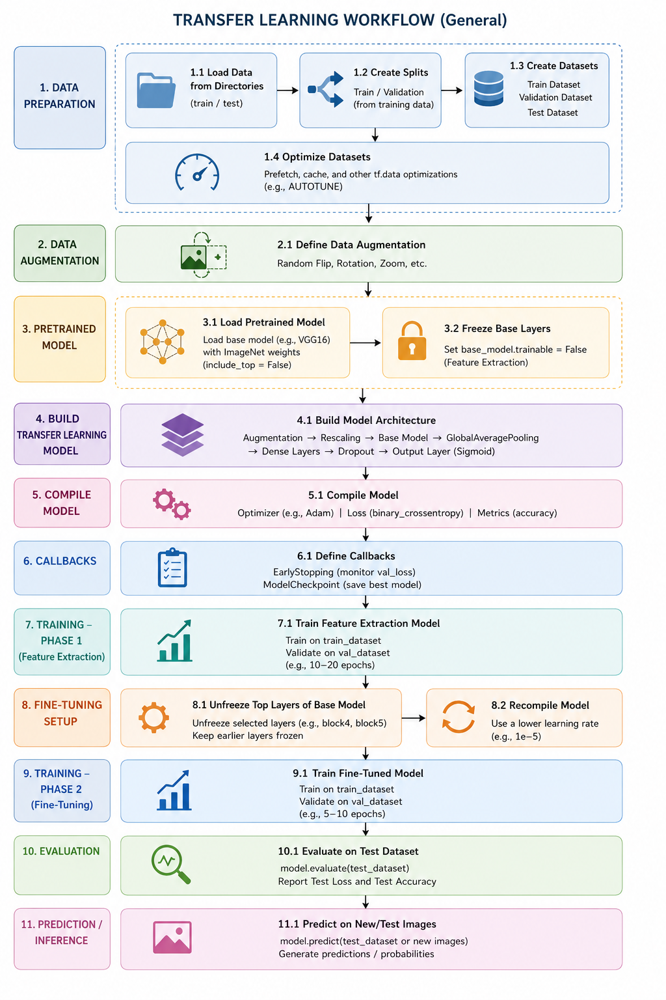

In [39]:
## Define Parameters
IMG_SIZE = (150, 150)
BATCH_SIZE = 32
SEED = 42
VAL_SPLIT = 0.2

train_path = "./o-vs-r-split/train"
test_path = "./o-vs-r-split/test"

class_names = ["O", "R"]

## Create Training, Validation and Test Datasets
train_dataset = tf.keras.utils.image_dataset_from_directory(
    train_path,
    labels="inferred",
    label_mode="binary",
    class_names=class_names,
    validation_split=VAL_SPLIT,
    subset="training",
    seed=SEED,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    shuffle=True,
)

val_dataset = tf.keras.utils.image_dataset_from_directory(
    train_path,
    labels="inferred",
    label_mode="binary",
    class_names=class_names,
    validation_split=VAL_SPLIT,
    subset="validation",
    seed=SEED,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    shuffle=True,
)

test_dataset = tf.keras.utils.image_dataset_from_directory(
    test_path,
    labels="inferred",
    label_mode="binary",
    class_names=class_names,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    shuffle=False,
)

## Improve Dataset Performance
AUTOTUNE = tf.data.AUTOTUNE

train_dataset = train_dataset.prefetch(AUTOTUNE)
val_dataset = val_dataset.prefetch(AUTOTUNE)
test_dataset = test_dataset.prefetch(AUTOTUNE)

## Define Data Augmentation
data_augmentation = tf.keras.Sequential(
    [RandomFlip("horizontal"), RandomRotation(0.1), RandomZoom(0.1)]
)

## Load Pretrained VGG16 Model
base_model = VGG16(
    include_top=False, weights="imagenet", input_shape=(150, 150, 3)
)

## Freeze Pretrained Layers
base_model.trainable = False

## Build Transfer Learning Model
model = Sequential(
    [
        data_augmentation,
        Rescaling(1.0 / 255),
        base_model,
        GlobalAveragePooling2D(),
        Dense(512, activation="relu"),
        Dropout(0.3),
        Dense(512, activation="relu"),
        Dropout(0.3),
        Dense(1, activation="sigmoid"),
    ]
)

## Compile Model
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
    loss="binary_crossentropy",
    metrics=["accuracy"],
)

## Define Callbacks
callbacks = [
    EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True),
    ModelCheckpoint(
        filepath="best_waste_classifier.keras",
        monitor="val_loss",
        save_best_only=True,
    ),
]

## Train Feature Extraction Model
history = model.fit(
    train_dataset, validation_data=val_dataset, epochs=20, callbacks=callbacks
)

## Fine-Tuning
for layer in base_model.layers:

    if layer.name.startswith(("block4", "block5")):
        layer.trainable = True

    else:
        layer.trainable = False

## Recompile Model
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5),
    loss="binary_crossentropy",
    metrics=["accuracy"],
)

## Train Fine-Tuned Model
history_finetune = model.fit(
    train_dataset, validation_data=val_dataset, epochs=10, callbacks=callbacks
)

## Evaluate Model
test_loss, test_accuracy = model.evaluate(test_dataset)

print(f"Test Accuracy: {test_accuracy:.4f}")

## Predict New Images
predictions = model.predict(test_dataset)

Found 7262 files belonging to 2 classes.
Using 5810 files for training.
Found 7262 files belonging to 2 classes.
Using 1452 files for validation.
Found 828 files belonging to 2 classes.
Epoch 1/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 32s 171ms/step - accuracy: 0.8086 - loss: 0.4239 - val_accuracy: 0.8636 - val_loss: 0.3191
Epoch 2/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 31s 171ms/step - accuracy: 0.8604 - loss: 0.3406 - val_accuracy: 0.8871 - val_loss: 0.2827
Epoch 3/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 31s 171ms/step - accuracy: 0.8632 - loss: 0.3270 - val_accuracy: 0.9043 - val_loss: 0.2675
Epoch 4/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 31s 170ms/step - accuracy: 0.8761 - loss: 0.3024 - val_accuracy: 0.8981 - val_loss: 0.2628
Epoch 5/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 31s 171ms/step - accuracy: 0.8838 - loss: 0.2900 - val_accuracy: 0.9112 - val_loss: 0.2457
Epoch 6/20
182/182 ━━━━━━━━━━━━━━━━━━━━ 31s 170ms/step - accuracy: 0.8824 - loss: 0.2808 - val_accuracy: 0.9091 - val_loss: 0.2521
Epoch 7/20
182/182 ━━━━━━━━━

26/26 ━━━━━━━━━━━━━━━━━━━━ 4s 135ms/step


## **Example 2: Use Transfer Learning for identifying Stop Signs** <a id="toc-example-2-use-transfer-learning-for-identifying-stop-signs"></a>

Other than VGG-16, there are many state-of-the-art CNN architectures we could explore, such as **InceptionNet, MobileNet, ResNet, Xception**, and so on. There are more than two dozen pre-trained models available from Keras that we could use directly for transfer learning. In this example, we will implement some of them for distinguishing stop signs. 

The stop sign datasets will be downloaded using the following cells. Compared to a typical dataset of images, the stop sign dataset is relatively small as it only contains around 200 training images and 8 test images. This is when transfer learning should come to rescue, because training models from scratch would require a lot of data, otherwise you will likely overfit your model. 


### **Loading images** <a id="toc-loading-images"></a>


Uncomment the following cell to download the data files and unzip them.


In [40]:
await skillsnetwork.prepare(
    "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-Coursera/dataset/stop.zip",
    overwrite=True,
)
await skillsnetwork.prepare(
    "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-Coursera/dataset/not_stop.zip",
    overwrite=True,
)
await skillsnetwork.prepare(
    "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-Coursera/dataset/test_set_stop_not_stop.zip",
    overwrite=True,
)

  0%|          | 0/197 [00:00<?, ?it/s]

Saved to '.'


  0%|          | 0/203 [00:00<?, ?it/s]

Saved to '.'


  0%|          | 0/19 [00:00<?, ?it/s]

Saved to '.'


#### **Creating image directories** <a id="toc-creating-image-directories"></a>

We will rearange the image directories as follows:

```python
signs/
└── train
    ├── stop
    └── not_stop
└── test
    ├── stop
    └── not_stop
```

We will have a train and a test directory, and each contains images that have stop signs and those that don't. This setup of directories will be handy when we use the `flow_from_directory` function later to build data generators.


In [41]:
dataset_home = "signs/"
subdirs = ["train/", "test/"]
for subdir in subdirs:
    labeldirs = ["stop/", "not_stop/"]
    for labeldir in labeldirs:
        newdir = dataset_home + subdir + labeldir
        makedirs(newdir, exist_ok=True)

#### **Moving images** <a id="toc-moving-images"></a>

Let's move the images according to the map above.


In [42]:
for file in listdir("stop"):
    if file != ".DS_Store":
        shutil.copyfile(f"stop/{file}", f"signs/train/stop/{file}")

for file in listdir("not_stop"):
    if file != ".DS_Store":
        shutil.copyfile(f"not_stop/{file}", f"signs/train/not_stop/{file}")

test_path = "test_set_stop_not_stop/"
for file in listdir(test_path):
    if file.startswith("stop"):
        shutil.copyfile(test_path + file, f"signs/test/stop/{file}")
    elif file.startswith("not_stop"):
        shutil.copyfile(test_path + file, f"signs/test/not_stop/{file}")

#### **Displaying raw images** <a id="toc-displaying-raw-images"></a>

Use the following code to display the first five images in the train set that have stop signs and the first five images that don't have stop signs.


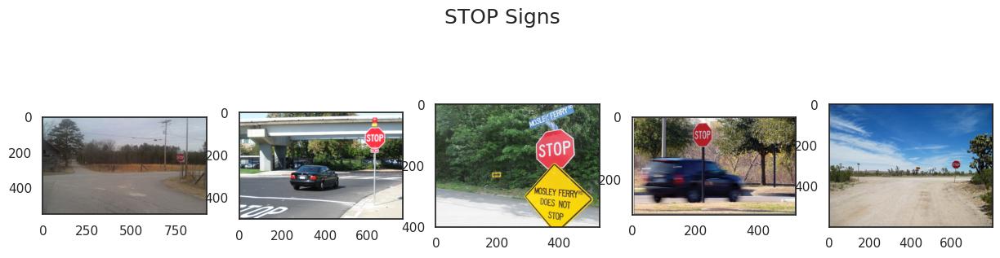

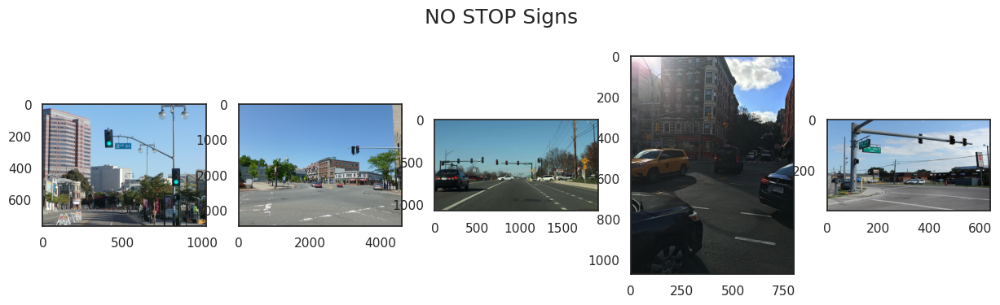

In [43]:
train_stop = glob.glob("./signs/train/stop/*")
train_not_stop = glob.glob("./signs/train/not_stop/*")

fig1, ax1 = plt.subplots(1, 5, figsize=(15, 4))
fig1.suptitle("STOP Signs", fontsize=18)
l1 = [ax1[i].imshow(imread(train_stop[i])) for i in range(5)]

fig2, ax2 = plt.subplots(1, 5, figsize=(15, 4))
fig2.suptitle("NO STOP Signs", fontsize=18)
l2 = [ax2[i].imshow(imread(train_not_stop[i])) for i in range(5)]

#### **Building image data generators** <a id="toc-building-image-data-generators"></a>


Same as what we did for the waste data, we will build image data generators that perform real-time image augmentation while returning batches of image data. We will apply image augmentation on the training data only. We use a validation split of 0.2 and a batch size of 30.


In [44]:
path = "signs/train/"
labels = ["stop", "not_stop"]
seed = 123
batch_size = 30
target_size = (112, 112)

In [45]:
train_datagen = ImageDataGenerator(
    validation_split=0.2,
    rescale=1.0 / 255.0,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
)

val_datagen = ImageDataGenerator(validation_split=0.2, rescale=1.0 / 255.0)

In [46]:
train_generator = train_datagen.flow_from_directory(
    directory=path,
    classes=labels,
    seed=seed,
    batch_size=batch_size,
    class_mode="binary",
    shuffle=True,
    target_size=target_size,
    subset="training",
)

val_generator = val_datagen.flow_from_directory(
    directory=path,
    classes=labels,
    seed=seed,
    batch_size=batch_size,
    class_mode="binary",
    shuffle=True,
    target_size=target_size,
    subset="validation",
)

Found 158 images belonging to 2 classes.
Found 39 images belonging to 2 classes.


In [47]:
print(train_generator.class_indices)

prob2class = lambda x: "Stop" if x < 0.5 else "Not Stop"

{'stop': 0, 'not_stop': 1}


For our test images, we convert them into numpy arrays with pixel values scaled to 0-1. The test data will not be seen by the model during training or validation, but they will be used to evaluate the predictive power of our model at the end.


In [48]:
test_files = glob.glob("signs/test/stop/*.jpeg") + glob.glob(
    "signs/test/not_stop/*.jpeg"
)
test_files = shuffle(test_files)

test_imgs = [
    tf.keras.preprocessing.image.img_to_array(
        tf.keras.preprocessing.image.load_img(img, target_size=target_size)
    )
    for img in test_files
]
test_imgs = np.array(test_imgs).astype("int")

# Standardize
test_imgs_scaled = test_imgs.astype("float32")
test_imgs_scaled /= 255

### **Defining a helper function for building, compiling, and fitting CNNs** <a id="toc-defining-a-helper-function-for-building-compiling-and-fitting-cnns"></a>


In [49]:
def build_compile_fit(basemodel):

    # flatten the output of the base model
    x = Flatten()(basemodel.output)
    # add a fully connected layer
    x = Dense(1024, activation="relu")(x)
    # add dropout layer for regularization
    x = Dropout(0.2)(x)
    # add final layer for classification
    x = Dense(1, activation="sigmoid")(x)

    model = Model(basemodel.input, x)
    model.compile(
        optimizer=optimizers.RMSprop(learning_rate=0.0001),
        loss="binary_crossentropy",
        metrics=["accuracy"],
    )
    callbacks = [
        EarlyStopping(monitor="loss", patience=5, mode="min", min_delta=0.01)
    ]

    model.fit(
        train_generator,
        validation_data=val_generator,
        steps_per_epoch=5,  # num of batches in one epoch
        epochs=10,
        callbacks=callbacks,
    )

    return model

### **Pre-trained Model 1: Inception-v3** <a id="toc-pre-trained-model-1-inception-v3"></a>


**Inception-v3** is a successor to Inception-v1 with 24 million parameters and ran 48 layers deep. 

Instead of focusing on increasing the depth of the network, InceptionNet focuses on increasing the width and depth of the model simultaneously to attain better accuracy, while keeping the computing resources constant. 

It focuses on **parallel processing** and extraction of various feature maps concurrently using **Inception modules**, which are collections of convolutions with different filter sizes and pooling operations. The following is an illustration of the inception module in inception-v1 architecture:

<center>
<img src="https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-ML311-Coursera/labs/Module3/L2/img/Inception_v1_module.png"></center>

Picture credits to [Wichai Puarungroj](https://www.researchgate.net/profile/Wichai-Puarungroj-2)

The inception architecture was refined in various ways, specifically for inception-v3, the following improvements are incorporated to achieve less expensive and still efficient networks:

- Factorization Into Smaller Convolutions
- Factorization Into Asymmetric Convolutions
- Auxiliary Classifier used as regularizer
- Efficient Grid Size Reduction

You can read more about the different versions of InceptionNet [here](https://towardsdatascience.com/a-simple-guide-to-the-versions-of-the-inception-network-7fc52b863202)


Let's import the pre-trained Inception-v3 architecture from keras applications for our transfer learning task:


In [50]:
from keras.applications.inception_v3 import InceptionV3

# initialize the base model
basemodel = InceptionV3(
    input_shape=(112, 112, 3), include_top=False, weights="imagenet"
)

for layer in basemodel.layers:
    layer.trainable = False

# call the build_compile_fit function to complete model training
inception_v3 = build_compile_fit(basemodel)

Epoch 1/10
5/5 ━━━━━━━━━━━━━━━━━━━━ 6s 897ms/step - accuracy: 0.6094 - loss: 2.8543 - val_accuracy: 0.4872 - val_loss: 2.1774
Epoch 2/10
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 238ms/step - accuracy: 0.5000 - loss: 2.1513 - val_accuracy: 0.7179 - val_loss: 1.3465
Epoch 3/10
5/5 ━━━━━━━━━━━━━━━━━━━━ 3s 656ms/step - accuracy: 0.6094 - loss: 1.4398 - val_accuracy: 0.4872 - val_loss: 1.7644
Epoch 4/10
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 232ms/step - accuracy: 0.4333 - loss: 3.1522 - val_accuracy: 0.7179 - val_loss: 1.1459
Epoch 5/10
5/5 ━━━━━━━━━━━━━━━━━━━━ 3s 665ms/step - accuracy: 0.7031 - loss: 1.0221 - val_accuracy: 0.7949 - val_loss: 0.4098
Epoch 6/10
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 236ms/step - accuracy: 0.6667 - loss: 0.5605 - val_accuracy: 0.7692 - val_loss: 0.3941
Epoch 7/10
5/5 ━━━━━━━━━━━━━━━━━━━━ 3s 689ms/step - accuracy: 0.7031 - loss: 0.9883 - val_accuracy: 0.6154 - val_loss: 0.6492
Epoch 8/10
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 235ms/step - accuracy: 0.7000 - loss: 0.5156 - val_accuracy: 0.6410 - val_loss:

The pre-trained part of our **inception_v3** model utilizes the weights obtained from the imagenet dataset training. Only the layers that we added are trained on the stop sign's data.

Let's now display the test images along with their class labels predicted by the fitted **inception_v3**:


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 871ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


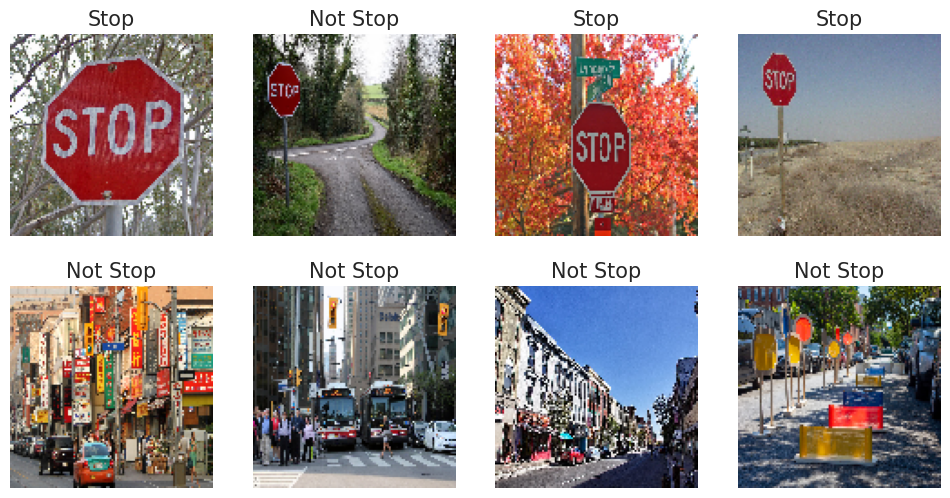

In [51]:
fig, ax = plt.subplots(2, 4, figsize=(12, 6))

for i, ax in enumerate(ax.flat):
    ax.imshow(test_imgs[i])
    pred_class = prob2class(
        inception_v3.predict(test_imgs_scaled[i].reshape(1, 112, 112, 3))
    )

    # print the predicted class label as the title of the image
    ax.set_title(pred_class, fontsize=15)
    ax.axis("off")

### **Pre-trained Model 2: MobileNet** <a id="toc-pre-trained-model-2-mobilenet"></a>


MobileNet is a lightweight and efficient deep learning architecture specifically designed for mobile and embedded devices. Its main advantage is that it achieves good image recognition performance while using much less computation and memory than traditional convolutional neural networks.

MobileNet introduces a special type of convolution called Depthwise Separable Convolution, which breaks a standard convolution into two smaller operations:

- Depthwise Convolution
- Pointwise Convolution

In a standard 2D convolution, each filter operates across all input channels at the same time and combines them into new feature maps. In contrast, **depthwise convolution** applies a separate filter to each input channel individually.

For example, if the input image has three channels (RGB), **depthwise convolution** applies one filter to each channel separately, producing three output channels.

The second step is **Pointwise Convolution**, which uses a  $1 \times 1$   convolution filter to combine information across channels and generate new features. This operation merges the outputs from the depthwise convolution into a new set of feature maps.

By separating convolution into these two simpler operations, MobileNet greatly reduces the number of parameters and computations, making it much faster and more efficient for mobile applications.

Let's import the pre-trained MobileNet architecture from keras applications for our transfer learning task:


In [52]:
from keras.applications.mobilenet import MobileNet

# initialize the base model
basemodel = MobileNet(
    input_shape=(112, 112, 3), include_top=False, weights="imagenet"
)

for layer in basemodel.layers:
    layer.trainable = False

# call the build_compile_fit function to complete model training
mobile_net = build_compile_fit(basemodel)

Epoch 1/10
5/5 ━━━━━━━━━━━━━━━━━━━━ 5s 976ms/step - accuracy: 0.5333 - loss: 3.7361 - val_accuracy: 0.8205 - val_loss: 0.6579
Epoch 2/10
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 230ms/step - accuracy: 0.5000 - loss: 5.5044 - val_accuracy: 0.4872 - val_loss: 2.2498
Epoch 3/10
5/5 ━━━━━━━━━━━━━━━━━━━━ 3s 561ms/step - accuracy: 0.7500 - loss: 0.7386 - val_accuracy: 0.6667 - val_loss: 0.7815
Epoch 4/10
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 232ms/step - accuracy: 0.8667 - loss: 0.4439 - val_accuracy: 0.6667 - val_loss: 0.7263
Epoch 5/10
5/5 ━━━━━━━━━━━━━━━━━━━━ 3s 633ms/step - accuracy: 0.8203 - loss: 0.4685 - val_accuracy: 0.8718 - val_loss: 0.2678
Epoch 6/10
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 230ms/step - accuracy: 0.9667 - loss: 0.1537 - val_accuracy: 0.7949 - val_loss: 0.4076
Epoch 7/10
5/5 ━━━━━━━━━━━━━━━━━━━━ 3s 703ms/step - accuracy: 0.7422 - loss: 0.9778 - val_accuracy: 0.4872 - val_loss: 2.3630
Epoch 8/10
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 226ms/step - accuracy: 0.6667 - loss: 1.3789 - val_accuracy: 0.8462 - val_loss:

Let's display the test images along with the their class labels predicted by the fitted **mobile_net**:


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


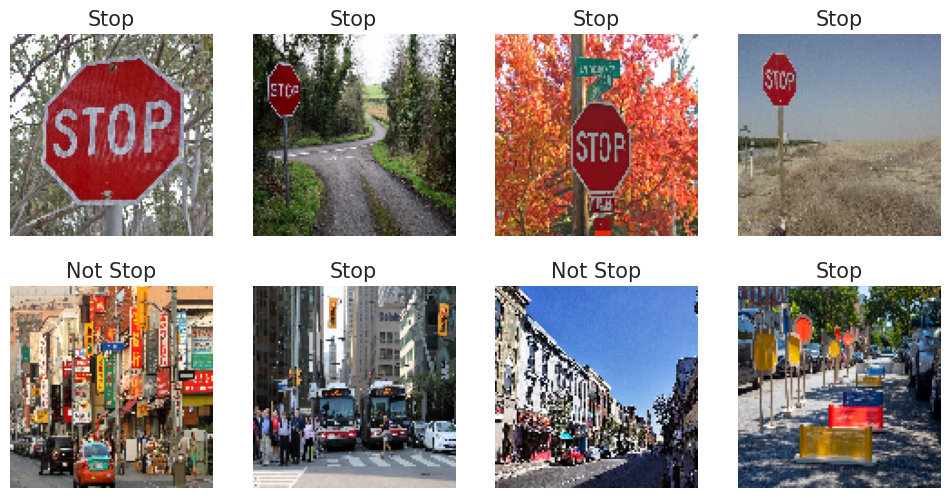

In [53]:
fig, ax = plt.subplots(2, 4, figsize=(12, 6))

for i, ax in enumerate(ax.flat):
    ax.imshow(test_imgs[i])
    pred_class = prob2class(
        mobile_net.predict(test_imgs_scaled[i].reshape(1, 112, 112, 3))
    )

    # print the predicted class label as the title of the image
    ax.set_title(pred_class, fontsize=15)
    ax.axis("off")

### **Pre-trained Model 3: ResNet-50** <a id="toc-pre-trained-model-3-resnet-50"></a>


**ResNet** features special skip connections which add the output from an earlier layer directly to a later layer and heavy use of batch normalization. It allows us to design deep CNNs without compromising the model’s convergence and accuracy. The basic building blocks for ResNets are the convolution and identity blocks. 

Essentially, ResNet uses the network layers to fit a residual mapping $F(x) + x$, instead of trying to learn the desired underlying mapping $H(x)$ directly with stacked layers. 

<center><img src="https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-ML311-Coursera/labs/Module3/L2/img/resnet.png" width="30%"></center>

The formulation of $F(x) + x$ can be realized by the feedforward neural networks with **shortcut connections**. Shortcut connections add the output from the previous layer directly to the output of the current layer, which can be seen as **identity mapping**.

By doing so, the network overcomes the vanishing gradient problem because now the gradient signals could travel back to early layers through this shortcut.


Similarly, let's import the pre-trained ResNet-50 architecture from keras applications.


In [54]:
from keras.applications import ResNet50

# initialize the base model
basemodel = ResNet50(
    input_shape=(112, 112, 3), include_top=False, weights="imagenet"
)

for layer in basemodel.layers:
    layer.trainable = False

# call the build_compile_fit function to complete model training
resnet_50 = build_compile_fit(basemodel)

Epoch 1/10
5/5 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - accuracy: 0.5467 - loss: 2.6385 - val_accuracy: 0.5128 - val_loss: 0.9609
Epoch 2/10
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 239ms/step - accuracy: 0.5000 - loss: 0.8433 - val_accuracy: 0.4872 - val_loss: 2.1937
Epoch 3/10
5/5 ━━━━━━━━━━━━━━━━━━━━ 3s 690ms/step - accuracy: 0.4297 - loss: 1.7976 - val_accuracy: 0.5128 - val_loss: 0.7521
Epoch 4/10
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 241ms/step - accuracy: 0.4333 - loss: 0.7972 - val_accuracy: 0.4872 - val_loss: 1.1306
Epoch 5/10
5/5 ━━━━━━━━━━━━━━━━━━━━ 3s 747ms/step - accuracy: 0.4531 - loss: 1.0351 - val_accuracy: 0.5128 - val_loss: 0.7248
Epoch 6/10
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 243ms/step - accuracy: 0.4333 - loss: 0.7922 - val_accuracy: 0.4872 - val_loss: 0.8452
Epoch 7/10
5/5 ━━━━━━━━━━━━━━━━━━━━ 4s 738ms/step - accuracy: 0.4933 - loss: 0.9806 - val_accuracy: 0.4872 - val_loss: 1.3317
Epoch 8/10
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 248ms/step - accuracy: 0.3750 - loss: 1.5424 - val_accuracy: 0.5128 - val_loss: 1.

Let's display the test images along with their class labels predicted by **resnet_50**:


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


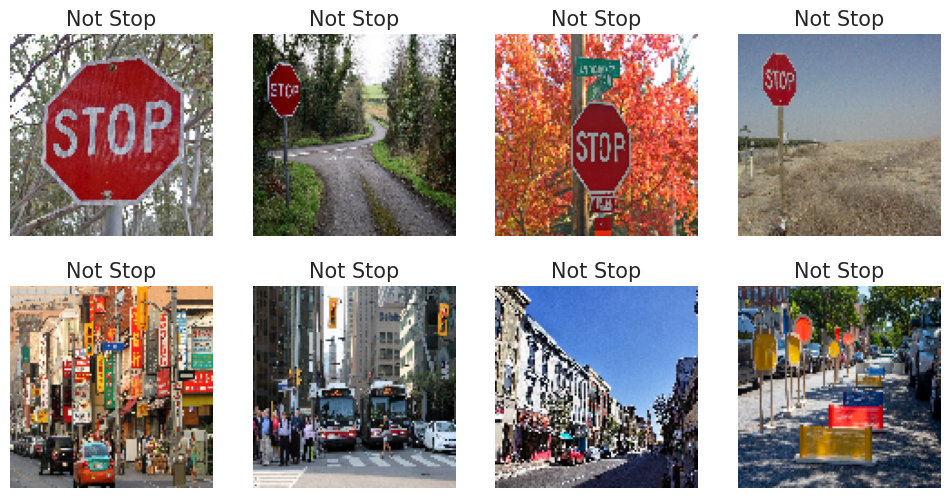

In [55]:
fig, ax = plt.subplots(2, 4, figsize=(12, 6))

for i, ax in enumerate(ax.flat):
    ax.imshow(test_imgs[i])
    pred_class = prob2class(
        resnet_50.predict(test_imgs_scaled[i].reshape(1, 112, 112, 3))
    )

    # print the predicted class label as the title of the image
    ax.set_title(pred_class, fontsize=15)
    ax.axis("off")

## **Authors**


[Kopal Garg](https://www.linkedin.com/in/gargkopal/?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkCoursesIBMDeveloperSkillsNetworkML311Coursera35714171-2022-01-01)


Kopal Garg is a Masters student in Computer Science at the University of Toronto.


[Roxanne Li](https://www.linkedin.com/in/roxanne-li/) is a Data Science intern at IBM Skills Network, entering level-5 study in the Mathematics & Statistics undergraduate Coop program at McMaster University.


Su Wu

## **Change Log**


| Date (YYYY-MM-DD) | Version | Changed By  | Change Description |
| ----------------- | ------- | ----------- | ------------------ |
| 2022-05-31        | 0.1     | Kopal Garg  | Created Lab        |
| 2022-06-28        | 0.1     | Roxanne Li  | Added examples     |
| 2022-09-07        | 0.1     | Steve Hord  | QA pass edits      |
| 2026-05-24     | 0.1     | Su Wu| Documentation and script edit    |